Predicting future energy consumption provides a range of benefits across different sectors, including economic, environmental, and operational advantages. Here’s a comprehensive look at the key benefits:

### 1. **Optimized Resource Management**

- **Efficient Use of Resources**: Accurate forecasts help utilities and organizations manage energy resources more effectively, ensuring that energy supply meets demand without overproduction or shortages.
- **Cost Savings**: By predicting consumption patterns, companies can optimize their purchasing and storage of energy, potentially reducing costs by avoiding peak pricing or buying in bulk.

### 2. **Enhanced Planning and Infrastructure**

- **Infrastructure Investment**: Forecasting helps in planning for future energy needs, guiding investments in infrastructure such as power plants, grid upgrades, or renewable energy sources.
- **Demand Response**: Utilities can better plan for demand response strategies, including load shifting or implementing conservation programs during peak periods.

### 3. **Improved Reliability and Stability**

- **Grid Stability**: Predicting energy consumption helps maintain grid stability by balancing supply and demand, reducing the risk of blackouts or brownouts.
- **Maintenance Scheduling**: Predictive insights allow for more effective scheduling of maintenance and upgrades, minimizing disruptions.

### 4. **Environmental Impact Reduction**

- **Energy Efficiency**: Forecasting can identify opportunities for improving energy efficiency, such as optimizing heating, ventilation, and air conditioning (HVAC) systems or reducing waste.
- **Renewable Integration**: It supports better integration of renewable energy sources by matching them with predicted demand, leading to a reduction in reliance on fossil fuels and lower greenhouse gas emissions.

### 5. **Economic and Strategic Advantages**

- **Financial Planning**: Accurate predictions help businesses and governments budget more effectively for energy costs, allowing for better financial planning and risk management.
- **Competitive Edge**: Organizations with advanced forecasting capabilities can gain a competitive edge by being more agile and responsive to changes in energy markets.

### 6. **Consumer Benefits**

- **Cost Savings for Consumers**: Predictive insights can lead to better pricing models for consumers, potentially offering lower rates or incentives for shifting consumption to off-peak times.
- **Enhanced Service Quality**: Utilities and service providers can offer more reliable service and better customer support by anticipating and addressing potential issues proactively.

### 7. **Policy and Regulatory Compliance**

- **Regulatory Requirements**: Accurate forecasting helps meet regulatory requirements and targets for energy consumption, efficiency, and sustainability.
- **Informed Policy Making**: Governments and policymakers can use consumption forecasts to develop informed policies and regulations that promote energy conservation and sustainability.

### Example Scenario: A Utility Company

Let’s say you’re managing a utility company and you use predictive models to forecast energy consumption:

1. **Demand Forecasting**:
   - **Benefit**: You anticipate higher demand during hot summer months and ensure you have enough supply.
   - **Action**: You schedule maintenance during off-peak times to avoid disrupting service during high-demand periods.

2. **Resource Optimization**:
   - **Benefit**: You optimize the use of renewable energy sources, reducing reliance on fossil fuels.
   - **Action**: You adjust energy purchases based on predicted demand, buying more energy when prices are lower.

3. **Consumer Engagement**:
   - **Benefit**: You offer incentives for customers to use energy during off-peak hours.
   - **Action**: You implement a dynamic pricing model that reflects predicted demand and encourages energy use when it’s less costly.

### Summary

Predicting future energy consumption enables more effective resource management, enhances reliability and stability, reduces environmental impacts, and supports economic and strategic planning. By leveraging accurate forecasts, organizations can improve operational efficiency, reduce costs, and contribute to a more sustainable and reliable energy system.

In [1]:
import pandas as pd


In [2]:
df=pd.read_csv('PJME_hourly.csv')

In [3]:
df

,Datetime,PJME_MW
0,2002-12-31 01:00:00,26498.0
1,2002-12-31 02:00:00,25147.0
2,2002-12-31 03:00:00,24574.0
3,2002-12-31 04:00:00,24393.0
4,2002-12-31 05:00:00,24860.0
...,...,...
145361,2018-01-01 20:00:00,44284.0
145362,2018-01-01 21:00:00,43751.0
145363,2018-01-01 22:00:00,42402.0
145364,2018-01-01 23:00:00,40164.0


PJME_MW stands for "PJM Pennsylvania, Jersey, Maryland East Megawatt." It refers to the electrical power consumption data in megawatts (MW) for the PJM East region.

PJM is a regional transmission organization (RTO) in the United States that coordinates the movement of wholesale electricity in several states, mainly in the eastern and midwestern U.S. The PJM Interconnection is responsible for managing the electricity grid to ensure reliability and efficiency across this region.

PJME_MW is typically used in time series datasets that track the power consumption over time, which is crucial for forecasting electricity demand, understanding consumption patterns, and planning for future energy needs.

# EDA

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145366 entries, 0 to 145365
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   Datetime  145366 non-null  object 
 1   PJME_MW   145366 non-null  float64
dtypes: float64(1), object(1)
memory usage: 2.2+ MB


In [5]:
df.describe()

,PJME_MW
count,145366.000000
mean,32080.222831
std,6464.012166
min,14544.000000
25%,27573.000000
50%,31421.000000
75%,35650.000000
max,62009.000000


In [6]:
df.isnull().sum()

,0
Datetime,0
PJME_MW,0


In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

<Axes: ylabel='Count'>

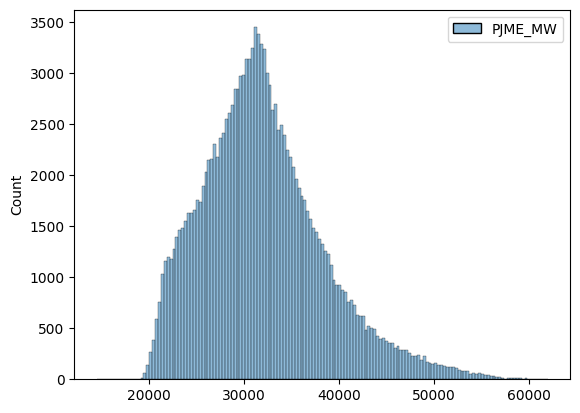

In [8]:
sns.histplot(df)

# Feature Engineering

In [9]:
# Datetime was an object - convert to Datetime
df['Datetime']=pd.to_datetime(df['Datetime'])

In [10]:
df['month']=df['Datetime'].dt.month
df

,Datetime,PJME_MW,month
0,2002-12-31 01:00:00,26498.0,12
1,2002-12-31 02:00:00,25147.0,12
2,2002-12-31 03:00:00,24574.0,12
3,2002-12-31 04:00:00,24393.0,12
4,2002-12-31 05:00:00,24860.0,12
...,...,...,...
145361,2018-01-01 20:00:00,44284.0,1
145362,2018-01-01 21:00:00,43751.0,1
145363,2018-01-01 22:00:00,42402.0,1
145364,2018-01-01 23:00:00,40164.0,1


In [11]:
df['year']=df['Datetime'].dt.year
df

,Datetime,PJME_MW,month,year
0,2002-12-31 01:00:00,26498.0,12,2002
1,2002-12-31 02:00:00,25147.0,12,2002
2,2002-12-31 03:00:00,24574.0,12,2002
3,2002-12-31 04:00:00,24393.0,12,2002
4,2002-12-31 05:00:00,24860.0,12,2002
...,...,...,...,...
145361,2018-01-01 20:00:00,44284.0,1,2018
145362,2018-01-01 21:00:00,43751.0,1,2018
145363,2018-01-01 22:00:00,42402.0,1,2018
145364,2018-01-01 23:00:00,40164.0,1,2018


In [12]:
import plotly.express as px

In [13]:
px.line(df,x='Datetime',y='PJME_MW')

/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


In [14]:
px.line(df,x='year',y='PJME_MW')

In [15]:
df_sorted=df.sort_values(by='year')
df_sorted

,Datetime,PJME_MW,month,year
0,2002-12-31 01:00:00,26498.0,12,2002
5847,2002-05-02 17:00:00,32588.0,5,2002
5846,2002-05-02 16:00:00,32596.0,5,2002
5845,2002-05-02 15:00:00,32544.0,5,2002
5844,2002-05-02 14:00:00,32593.0,5,2002
...,...,...,...,...
141937,2018-05-23 03:00:00,22418.0,5,2018
141936,2018-05-23 02:00:00,22967.0,5,2018
141935,2018-05-23 01:00:00,23964.0,5,2018
141993,2018-05-21 11:00:00,30738.0,5,2018


In [16]:
fig=px.line(df_sorted,x='year',y='PJME_MW')
fig

<Axes: xlabel='year', ylabel='PJME_MW'>

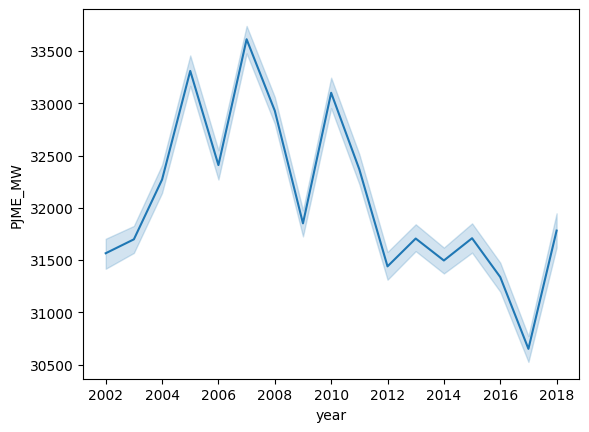

In [17]:
sns.lineplot(data=df,x='year',y='PJME_MW')

In [18]:
import plotly.express as px
import pandas as pd

# Aggregate the data by taking the mean of 'PJME_MW' for each 'year'
df_aggregated = df.groupby('year', as_index=False)['PJME_MW'].mean()

# Plot with Plotly after aggregation
fig = px.line(df_aggregated, x='year', y='PJME_MW')
fig.show()


In [19]:
df_2007=df[df['year']==2007]
df_2007

,Datetime,PJME_MW,month,year
35079,2007-01-01 00:00:00,28479.0,1,2007
43814,2007-12-31 01:00:00,28289.0,12,2007
43815,2007-12-31 02:00:00,27171.0,12,2007
43816,2007-12-31 03:00:00,26558.0,12,2007
43817,2007-12-31 04:00:00,26487.0,12,2007
...,...,...,...,...
52567,2007-01-01 20:00:00,32918.0,1,2007
52568,2007-01-01 21:00:00,32243.0,1,2007
52569,2007-01-01 22:00:00,30825.0,1,2007
52570,2007-01-01 23:00:00,28668.0,1,2007


1. Visual Inspection
Plot the Time Series: The first step is to visually inspect the time series plot.
Trends: Look for any obvious upward or downward trends.
Seasonality: Identify any repeating patterns over time.
Variance: Observe if the variance (spread) of the data changes over time.
If the series has a trend or changing variance, it may be non-stationary.

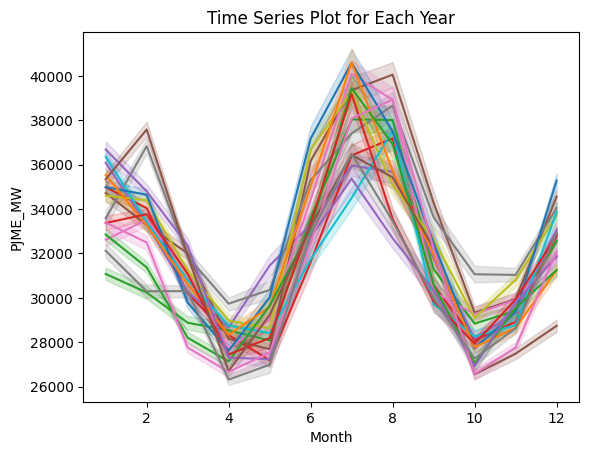

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns


for i in range(1980,2018):
    df_temp = df[df['year'] == i]
    sns.lineplot(data=df_temp, x='month', y='PJME_MW')




plt.xlabel('Month')
plt.ylabel('PJME_MW')
plt.title('Time Series Plot for Each Year')
# plt.legend()
plt.show()


There is some pattern and trend for all the years across months.
There is also seasonality - repeating patterns over time

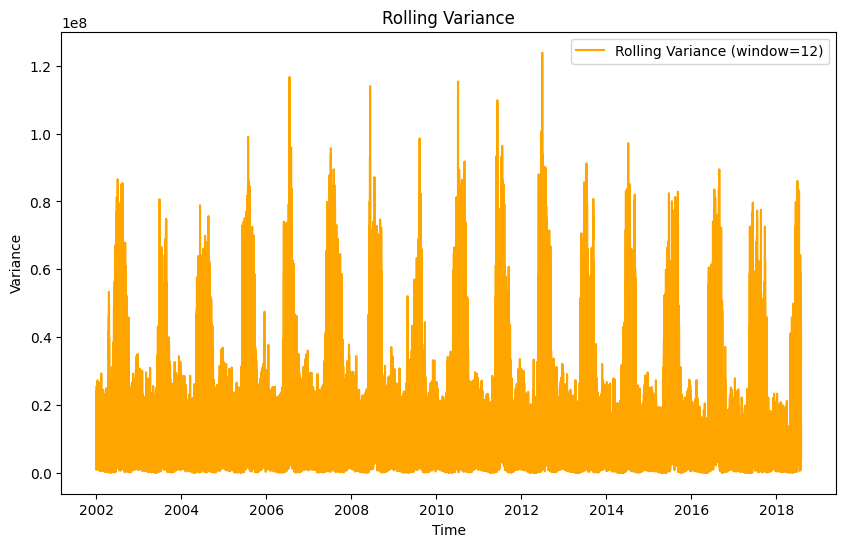

In [21]:
import pandas as pd
import matplotlib.pyplot as plt

# Set 'Datetime' as the index and ensure it's sorted
df['Datetime'] = pd.to_datetime(df['Datetime'])
df = df.set_index('Datetime').sort_index()

# Calculate rolling variance
window_size = 12  # You can adjust this based on your data
rolling_variance = df['PJME_MW'].rolling(window=window_size).var()

# Plot the rolling variance
plt.figure(figsize=(10, 6))
plt.plot(rolling_variance, label=f'Rolling Variance (window={window_size})', color='orange')
plt.title('Rolling Variance')
plt.xlabel('Time')
plt.ylabel('Variance')
plt.legend()
plt.show()


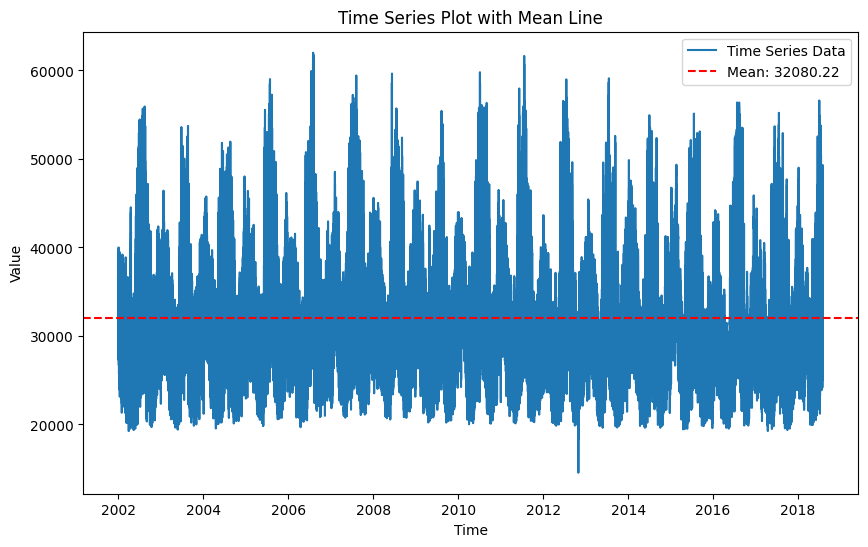

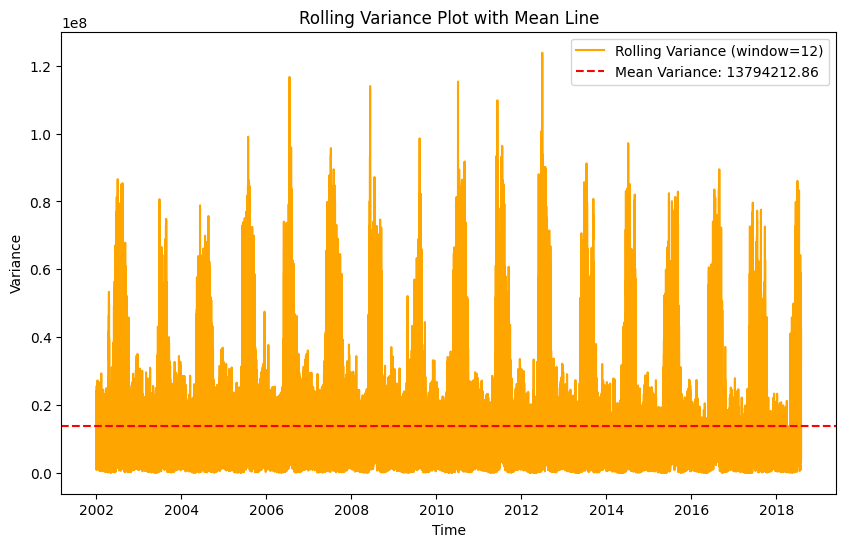

In [22]:
import pandas as pd
import matplotlib.pyplot as plt

data = df['PJME_MW']

# Calculate the mean of the data
mean_value = data.mean()

# Plot the time series with the mean line
plt.figure(figsize=(10, 6))
plt.plot(data, label='Time Series Data')
plt.axhline(y=mean_value, color='red', linestyle='--', label=f'Mean: {mean_value:.2f}')
plt.title('Time Series Plot with Mean Line')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()

# Calculate rolling variance
window_size = 12
rolling_variance = data.rolling(window=window_size).var()

# Plot the rolling variance
plt.figure(figsize=(10, 6))
plt.plot(rolling_variance, label=f'Rolling Variance (window={window_size})', color='orange')
plt.axhline(y=rolling_variance.mean(), color='red', linestyle='--', label=f'Mean Variance: {rolling_variance.mean():.2f}')
plt.title('Rolling Variance Plot with Mean Line')
plt.xlabel('Time')
plt.ylabel('Variance')
plt.legend()
plt.show()


Variance is high - Model choice? Tree-Based Models (e.g., Random Forest, Gradient Boosting): These models can handle non-linear relationships and complex interactions in data with high variance. They are flexible but may require more data and tuning.

In [23]:
import plotly.express as px
import pandas as pd

# Aggregate the data by taking the mean of 'PJME_MW' for each 'year'
df2007_aggregated = df_2007.groupby('month', as_index=False)['PJME_MW'].mean()


# Plot with Plotly after aggregation
fig = px.line(df2007_aggregated, x='month', y='PJME_MW')
fig.show()


<Axes: xlabel='month', ylabel='PJME_MW'>

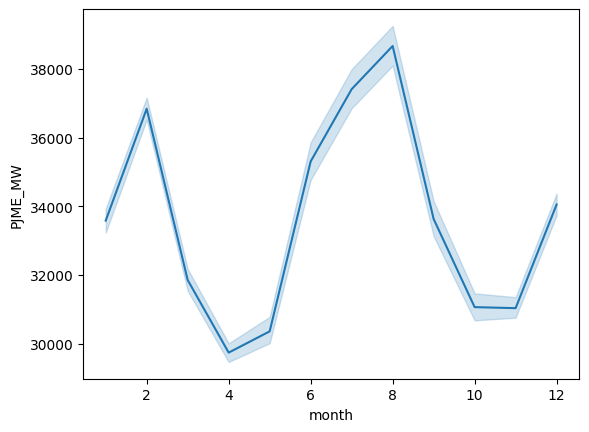

In [24]:
sns.lineplot(data=df_2007,x='month',y='PJME_MW')

In [25]:
df.dtypes

,0
PJME_MW,float64
month,int32
year,int32


In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

train, test = train_test_split(df,
                               test_size=0.15,
                               random_state=37
                               )

In [27]:

print(train.shape)
print(test.shape)

(123561, 3)
(21805, 3)


In [28]:
display(train['PJME_MW'].value_counts())
print('\n')
display(test['PJME_MW'].value_counts())

,count
PJME_MW,
30051.0,22
31116.0,20
31050.0,20
34365.0,20
30351.0,19
...,...
59437.0,1
41699.0,1
50489.0,1


,count
PJME_MW,
31897.0,7
31204.0,7
33016.0,7
28504.0,7
33377.0,7
...,...
30855.0,1
40264.0,1
26010.0,1


In [29]:
print(train.shape)
print(train.copy().drop_duplicates().shape)

print(test.shape)
print(test.copy().drop_duplicates().shape)

# No duplicates in the dataset

(123561, 3)
(121164, 3)
(21805, 3)
(21736, 3)


In [30]:
def create_features(df):
    df['year'] = df.index.year
    df['month'] = df.index.month
    df['day'] = df.index.day
    df['hour'] = df.index.hour
    df['dayofweek'] = df.index.dayofweek
    df['dayofyear'] = df.index.dayofyear
    df['weekofyear'] = df.index.isocalendar().week
    return df

In [31]:
# def create_features(df):
#     df['year'] = df['Datetime'].dt.year
#     df['month'] = df['Datetime'].dt.month
#     df['day'] = df['Datetime'].dt.day
#     df['hour'] = df['Datetime'].dt.hour
#     df['dayofweek'] = df['Datetime'].dt.dayofweek
#     df['dayofyear'] = df['Datetime'].dt.dayofyear
#     df['weekofyear'] = df['Datetime'].dt.isocalendar().week
#     return df

In [32]:
train=create_features(train)
test=create_features(test)


In [33]:
train.sort_index()

,PJME_MW,month,year,day,hour,dayofweek,dayofyear,weekofyear
Datetime,,,,,,,,
2002-01-01 01:00:00,30393.0,1,2002,1,1,1,1,1
2002-01-01 03:00:00,28357.0,1,2002,1,3,1,1,1
2002-01-01 04:00:00,27899.0,1,2002,1,4,1,1,1
2002-01-01 05:00:00,28057.0,1,2002,1,5,1,1,1
2002-01-01 06:00:00,28654.0,1,2002,1,6,1,1,1
...,...,...,...,...,...,...,...,...
2018-08-02 18:00:00,46760.0,8,2018,2,18,3,214,31
2018-08-02 20:00:00,44057.0,8,2018,2,20,3,214,31
2018-08-02 21:00:00,43256.0,8,2018,2,21,3,214,31


In [34]:
test.sort_index()

,PJME_MW,month,year,day,hour,dayofweek,dayofyear,weekofyear
Datetime,,,,,,,,
2002-01-01 02:00:00,29265.0,1,2002,1,2,1,1,1
2002-01-01 09:00:00,29943.0,1,2002,1,9,1,1,1
2002-01-01 11:00:00,31395.0,1,2002,1,11,1,1,1
2002-01-01 19:00:00,35732.0,1,2002,1,19,1,1,1
2002-01-02 02:00:00,27437.0,1,2002,2,2,2,2,1
...,...,...,...,...,...,...,...,...
2018-08-01 11:00:00,40316.0,8,2018,1,11,2,213,31
2018-08-02 01:00:00,34283.0,8,2018,2,1,3,214,31
2018-08-02 04:00:00,29791.0,8,2018,2,4,3,214,31


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



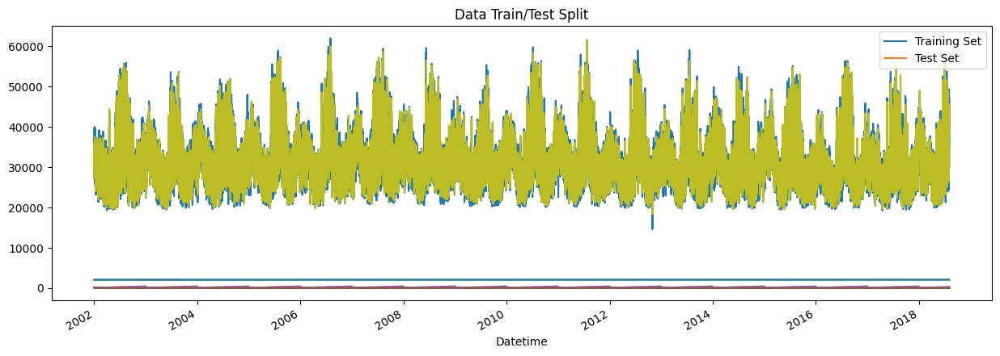

In [35]:
fig, ax = plt.subplots(figsize=(15, 5))
train.plot(ax=ax, label='Training Set', title='Data Train/Test Split')
test.plot(ax=ax, label='Test Set')
ax.legend(['Training Set', 'Test Set'])
plt.show()

Potential Data Leakage: The overlapping appearance might suggest data leakage or an incorrect split. This should be double-checked to ensure proper separation of training and test data.

### Inspecting the split
Solving incorrect data split

In [36]:
import pandas as pd


# Ensure index is datetime
df.index = pd.to_datetime(df.index)

# Calculate the index where the test set should start
train_size = int(len(df) * 0.85)  # 85% for training

# Split the data
train_1 = df.iloc[:train_size]
test_1 = df.iloc[train_size:]

# Optionally, you can verify that the split is correct by checking the last and first dates
print("Training set ends at:", train_1.index[-1])
print("Test set starts at:", test_1.index[0])


Training set ends at: 2016-02-06 10:00:00
Test set starts at: 2016-02-06 11:00:00


In [37]:
train_1.sort_index()

,PJME_MW,month,year
Datetime,,,
2002-01-01 01:00:00,30393.0,1,2002
2002-01-01 02:00:00,29265.0,1,2002
2002-01-01 03:00:00,28357.0,1,2002
2002-01-01 04:00:00,27899.0,1,2002
2002-01-01 05:00:00,28057.0,1,2002
...,...,...,...
2016-02-06 06:00:00,29972.0,2,2016
2016-02-06 07:00:00,31468.0,2,2016
2016-02-06 08:00:00,32668.0,2,2016


In [38]:
test_1.sort_index()

,PJME_MW,month,year
Datetime,,,
2016-02-06 11:00:00,32173.0,2,2016
2016-02-06 12:00:00,31337.0,2,2016
2016-02-06 13:00:00,30545.0,2,2016
2016-02-06 14:00:00,29757.0,2,2016
2016-02-06 15:00:00,29254.0,2,2016
...,...,...,...
2018-08-02 20:00:00,44057.0,8,2018
2018-08-02 21:00:00,43256.0,8,2018
2018-08-02 22:00:00,41552.0,8,2018


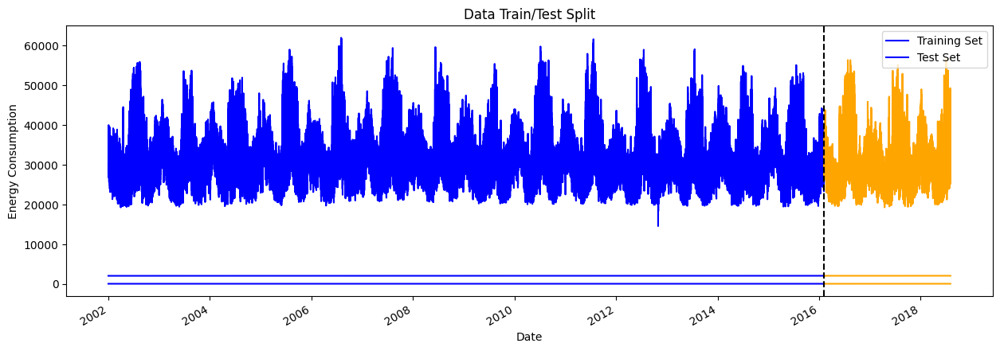

In [39]:
fig, ax = plt.subplots(figsize=(15, 5))

# Plot both training and test sets
train_1.plot(ax=ax, label='Training Set', color='blue')
test_1.plot(ax=ax, label='Test Set', color='orange')

# Add a vertical line to indicate the split
ax.axvline(pd.Timestamp('2016-02-06'), color='black', linestyle='--', label='Train/Test Split')

# Set title and labels
ax.set_title('Data Train/Test Split')
ax.set_xlabel('Date')
ax.set_ylabel('Energy Consumption')

# Show the legend
ax.legend(['Training Set', 'Test Set'])

# Show the plot
plt.show()

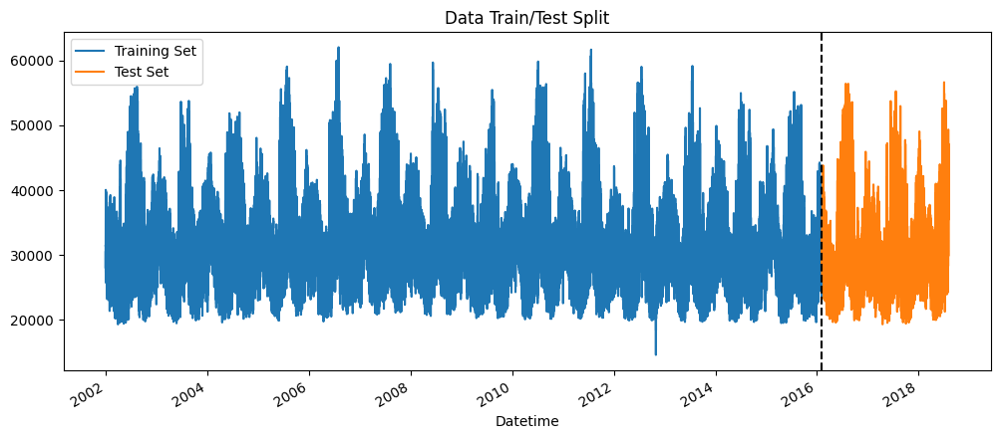

In [78]:
# For example, you might want to set a specific cut-off date
cutoff_date = '2016-02-06'  # Replace with your desired cutoff date

train_data = data[:cutoff_date]
test_data = data[cutoff_date:]

fig, ax = plt.subplots(figsize=(12, 5))
train_data.plot(ax=ax, label='Training Set', title='Data Train/Test Split')
test_data.plot(ax=ax, label='Test Set')
ax.axvline('02-06-2016', color='black', ls='--')
ax.legend(['Training Set', 'Test Set'])
plt.show()

In [41]:
train_11=create_features(train_1.copy())
test_11=create_features(test_1.copy())


In [42]:
train_11.sort_index()

,PJME_MW,month,year,day,hour,dayofweek,dayofyear,weekofyear
Datetime,,,,,,,,
2002-01-01 01:00:00,30393.0,1,2002,1,1,1,1,1
2002-01-01 02:00:00,29265.0,1,2002,1,2,1,1,1
2002-01-01 03:00:00,28357.0,1,2002,1,3,1,1,1
2002-01-01 04:00:00,27899.0,1,2002,1,4,1,1,1
2002-01-01 05:00:00,28057.0,1,2002,1,5,1,1,1
...,...,...,...,...,...,...,...,...
2016-02-06 06:00:00,29972.0,2,2016,6,6,5,37,5
2016-02-06 07:00:00,31468.0,2,2016,6,7,5,37,5
2016-02-06 08:00:00,32668.0,2,2016,6,8,5,37,5


In [43]:
test_11.sort_index()

,PJME_MW,month,year,day,hour,dayofweek,dayofyear,weekofyear
Datetime,,,,,,,,
2016-02-06 11:00:00,32173.0,2,2016,6,11,5,37,5
2016-02-06 12:00:00,31337.0,2,2016,6,12,5,37,5
2016-02-06 13:00:00,30545.0,2,2016,6,13,5,37,5
2016-02-06 14:00:00,29757.0,2,2016,6,14,5,37,5
2016-02-06 15:00:00,29254.0,2,2016,6,15,5,37,5
...,...,...,...,...,...,...,...,...
2018-08-02 20:00:00,44057.0,8,2018,2,20,3,214,31
2018-08-02 21:00:00,43256.0,8,2018,2,21,3,214,31
2018-08-02 22:00:00,41552.0,8,2018,2,22,3,214,31


In [44]:
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error


In [45]:
# Example data preparation
X_train = train_11.drop(columns=['PJME_MW'])  # Features
y_train = train_11['PJME_MW']  # Target

X_test = test_11.drop(columns=['PJME_MW'])
y_test = test_11['PJME_MW']


In [46]:
X_train

,month,year,day,hour,dayofweek,dayofyear,weekofyear
Datetime,,,,,,,
2002-01-01 01:00:00,1,2002,1,1,1,1,1
2002-01-01 02:00:00,1,2002,1,2,1,1,1
2002-01-01 03:00:00,1,2002,1,3,1,1,1
2002-01-01 04:00:00,1,2002,1,4,1,1,1
2002-01-01 05:00:00,1,2002,1,5,1,1,1
...,...,...,...,...,...,...,...
2016-02-06 06:00:00,2,2016,6,6,5,37,5
2016-02-06 07:00:00,2,2016,6,7,5,37,5
2016-02-06 08:00:00,2,2016,6,8,5,37,5


In [47]:
y_train

,PJME_MW
Datetime,
2002-01-01 01:00:00,30393.0
2002-01-01 02:00:00,29265.0
2002-01-01 03:00:00,28357.0
2002-01-01 04:00:00,27899.0
2002-01-01 05:00:00,28057.0
...,...
2016-02-06 06:00:00,29972.0
2016-02-06 07:00:00,31468.0
2016-02-06 08:00:00,32668.0


In [48]:
# implement XGboost model


In [49]:
import xgboost as xgb
print(xgb.__version__)


2.1.1


In [50]:
pip install --upgrade xgboost


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.9/190.9 MB 2.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.3.1+cu121 requires nvidia-cublas-cu12==12.1.3.1; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cuda-cupti-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cuda-nvrtc-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cuda-runtime-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requires nvidia-cudnn-cu12==8.9.2.26; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.3.1+cu121 requ

In [51]:
from xgboost import XGBRegressor
model = XGBRegressor(n_estimators=500, learning_rate=0.01, random_state=42)


# Train the model with early stopping
model.fit(X_train, y_train,
          eval_set=[(X_test, y_test)],

          # early_stopping_rounds=10,  # Stop if no improvement after 10 rounds
          verbose=True)  # Optional: to see the training process


[0]	validation_0-rmse:6500.75434
[1]	validation_0-rmse:6460.08270
[2]	validation_0-rmse:6420.05909
[3]	validation_0-rmse:6380.81186
[4]	validation_0-rmse:6342.03823
[5]	validation_0-rmse:6303.92301
[6]	validation_0-rmse:6266.16566
[7]	validation_0-rmse:6229.11373
[8]	validation_0-rmse:6192.67724
[9]	validation_0-rmse:6156.77102
[10]	validation_0-rmse:6121.33649
[11]	validation_0-rmse:6086.49151
[12]	validation_0-rmse:6051.79283
[13]	validation_0-rmse:6017.94720
[14]	validation_0-rmse:5984.10292
[15]	validation_0-rmse:5950.93315
[16]	validation_0-rmse:5918.29399
[17]	validation_0-rmse:5886.46227
[18]	validation_0-rmse:5854.36022
[19]	validation_0-rmse:5823.34325
[20]	validation_0-rmse:5792.90287
[21]	validation_0-rmse:5762.55841
[22]	validation_0-rmse:5733.22076
[23]	validation_0-rmse:5703.78062
[24]	validation_0-rmse:5674.86234
[25]	validation_0-rmse:5646.60572
[26]	validation_0-rmse:5618.65185
[27]	validation_0-rmse:5591.01458
[28]	validation_0-rmse:5563.17166
[29]	validation_0-rmse:5

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=500, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

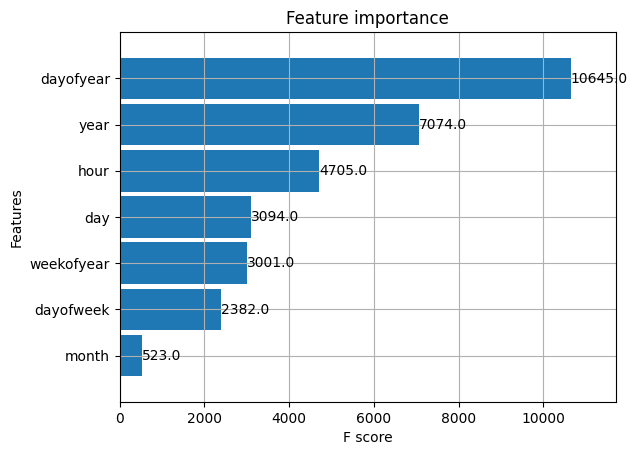

In [52]:
from xgboost import plot_importance, plot_tree

_ = xgb.plot_importance(model, height=0.9)

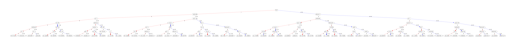

In [53]:
from xgboost import plot_tree

_ = plot_tree(model, num_trees=0)  # Plot the first tree
plt.show()


In [54]:
y_pred = model.predict(X_test)


In [55]:
y_pred

array([32932.605, 32378.072, 32196.686, ..., 39998.84 , 36959.254,
       32711.049], dtype=float32)

In [56]:
# print the metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print results
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)
print("R-squared (R2):", r2)


Mean Squared Error (MSE): 14156302.62211118
Root Mean Squared Error (RMSE): 3762.4862288267823
Mean Absolute Error (MAE): 2805.8186685787377
R-squared (R2): 0.6586257247856232


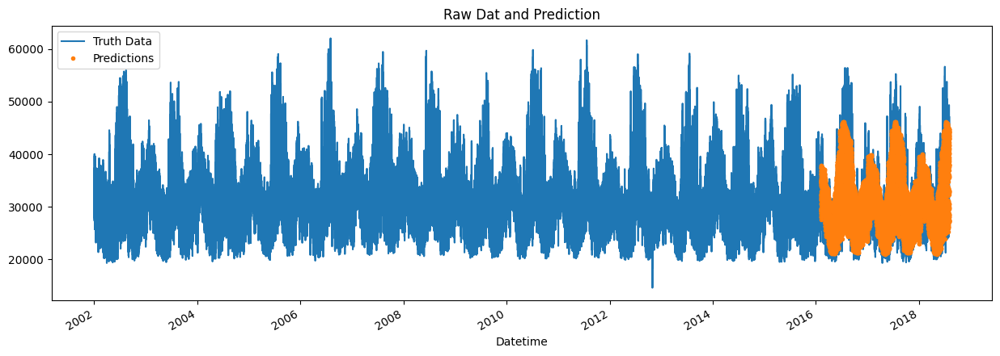

In [57]:
test_11['prediction'] = model.predict(X_test) # Make sure to create the 'prediction' column in 'test_11'
df = df.merge(test_11[['prediction']], how='left', left_index=True, right_index=True) # Now merge
ax = df[['PJME_MW']].plot(figsize=(15, 5))
df['prediction'].plot(ax=ax, style='.')
plt.legend(['Truth Data', 'Predictions'])
ax.set_title('Raw Dat and Prediction')
plt.show()

In [58]:
test_11.sort_index()

,PJME_MW,month,year,day,hour,dayofweek,dayofyear,weekofyear,prediction
Datetime,,,,,,,,,
2016-02-06 11:00:00,32173.0,2,2016,6,11,5,37,5,32932.605469
2016-02-06 12:00:00,31337.0,2,2016,6,12,5,37,5,32378.072266
2016-02-06 13:00:00,30545.0,2,2016,6,13,5,37,5,32196.685547
2016-02-06 14:00:00,29757.0,2,2016,6,14,5,37,5,31848.658203
2016-02-06 15:00:00,29254.0,2,2016,6,15,5,37,5,32108.664062
...,...,...,...,...,...,...,...,...,...
2018-08-02 20:00:00,44057.0,8,2018,2,20,3,214,31,42289.382812
2018-08-02 21:00:00,43256.0,8,2018,2,21,3,214,31,41755.464844
2018-08-02 22:00:00,41552.0,8,2018,2,22,3,214,31,39998.839844


In [59]:
df

,PJME_MW,month,year,prediction
Datetime,,,,
2002-01-01 01:00:00,30393.0,1,2002,NaN
2002-01-01 02:00:00,29265.0,1,2002,NaN
2002-01-01 03:00:00,28357.0,1,2002,NaN
2002-01-01 04:00:00,27899.0,1,2002,NaN
2002-01-01 05:00:00,28057.0,1,2002,NaN
...,...,...,...,...
2018-08-02 20:00:00,44057.0,8,2018,42289.382812
2018-08-02 21:00:00,43256.0,8,2018,41755.464844
2018-08-02 22:00:00,41552.0,8,2018,39998.839844


In [60]:
pjme_all = pd.concat([test_11, train_11], sort=False)
pjme_all

,PJME_MW,month,year,day,hour,dayofweek,dayofyear,weekofyear,prediction
Datetime,,,,,,,,,
2016-02-06 11:00:00,32173.0,2,2016,6,11,5,37,5,32932.605469
2016-02-06 12:00:00,31337.0,2,2016,6,12,5,37,5,32378.072266
2016-02-06 13:00:00,30545.0,2,2016,6,13,5,37,5,32196.685547
2016-02-06 14:00:00,29757.0,2,2016,6,14,5,37,5,31848.658203
2016-02-06 15:00:00,29254.0,2,2016,6,15,5,37,5,32108.664062
...,...,...,...,...,...,...,...,...,...
2016-02-06 06:00:00,29972.0,2,2016,6,6,5,37,5,NaN
2016-02-06 07:00:00,31468.0,2,2016,6,7,5,37,5,NaN
2016-02-06 08:00:00,32668.0,2,2016,6,8,5,37,5,NaN


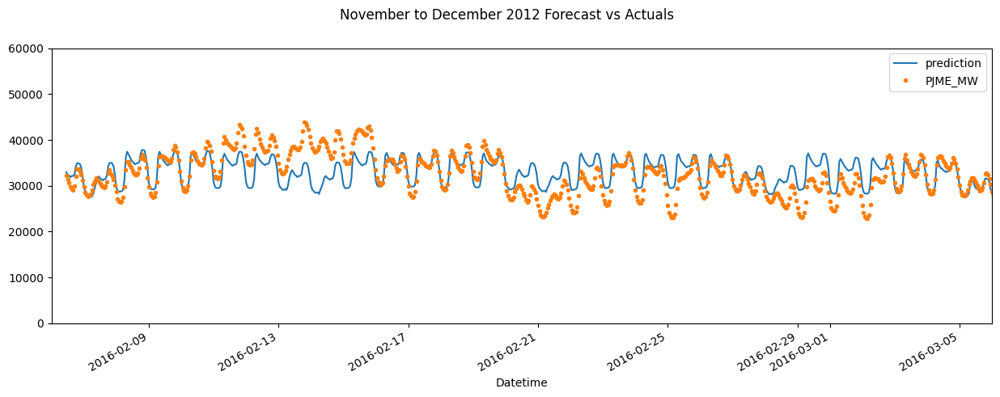

In [61]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = test_11[['prediction','PJME_MW']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='02-06-2016', upper='03-06-2016')
ax.set_ylim(0, 60000)
plot = plt.suptitle('November to December 2012 Forecast vs Actuals')

### What Does "Smoother" Mean in the Context of Time Series Predictions?

In the context of time series predictions, "smoother" refers to a situation where the predicted values (the blue line in your plot) show less variability or fluctuation compared to the actual values (the orange dots). Essentially, the predictions have fewer ups and downs, or less pronounced peaks and troughs, compared to the actual data.

### Recognizing Smoothness:

1. **Less Fluctuation**:
   - When the predicted line doesn't react as sharply to changes in the actual data, it appears smoother. For instance, if the actual data has sharp increases or decreases, but the predicted line shows only gentle slopes or relatively flat sections, this indicates smoothness.

2. **Damped Peaks and Troughs**:
   - The peaks (high points) and troughs (low points) in the predicted line are not as high or low as those in the actual data. This flattening effect is a sign of smoothness.

3. **Less Noise**:
   - If the actual data has small, frequent fluctuations (what we might call "noise"), but the predicted line appears to ignore these fluctuations and instead follows a more straightened path, this is another indicator of smoothness.

### In this Plot:
- The **actual data** (orange dots) shows more frequent and sharper changes, with some values spiking higher or dropping lower in quick succession.
- The **predicted data** (blue line), however, changes more gradually and does not reflect the full range of fluctuations seen in the actual data.

### Why Smoother Predictions Indicate Underfitting:

- **Model Simplicity**: If the model's predictions are too smooth, it suggests that the model is too simple and is not capturing the more complex patterns in the data. It might only be picking up the broader trend without responding accurately to the smaller, rapid changes in the data.
  
- **Lack of Detail**: A smooth prediction line implies that the model might be ignoring or missing out on some of the more nuanced variations in the actual data, leading to underfitting. Underfitting occurs when the model fails to learn the underlying patterns of the data, leading to predictions that are overly simplistic.

### Recognizing and Addressing Smoothness:

1. **Visual Inspection**:
   - As you've done with your plot, comparing the predicted line with the actual data visually is a good first step. Look for whether the predicted line seems to "smooth out" the fluctuations seen in the actual data.

2. **Statistical Metrics**:
   - Metrics like Mean Absolute Error (MAE), Mean Squared Error (MSE), and R-squared (R²) can also help identify underfitting. Low R² and high error metrics can be signs that the model isn't capturing the data's variability.

3. **Model Complexity**:
   - To address underfitting, you might increase the complexity of your model. In the case of XGBoost, this could involve:
     - **Increasing `n_estimators`**: Adding more trees can help capture more complexity.
     - **Reducing `learning_rate`**: This allows the model to learn more gradually and might encourage the model to capture more subtle patterns over time.
     - **Tuning `max_depth` and `min_child_weight`**: Adjusting these parameters can help the model capture more detailed patterns.

4. **Feature Engineering**:
   - Adding more relevant features, such as lagged variables or interaction terms, might help the model better capture the underlying patterns in the data.

By recognizing when your model's predictions are too smooth, you can take steps to increase its complexity and better capture the nuances of your time series data.

## PLotting worst days of Prediction

In [62]:
test_11['error'] = test_11['PJME_MW'] - test_11['prediction']
test_11['abs_error'] = test_11['error'].apply(np.abs)
error_by_day = test_11.groupby(['year','month','day']) \
    .mean()[['PJME_MW','prediction','error','abs_error']]
error_by_day.sort_values('error', ascending=False).head(10)

PJME_MW    prediction         error     abs_error
year month day                                                        
2016 8     13   45185.833333  32324.412109  12861.422363  12861.422363
           14   44427.333333  31869.185547  12558.149577  12558.149577
2017 12    31   39016.000000  26775.970703  12240.027913  12240.027913
2018 1     7    42159.708333  30198.070312  11961.637777  11961.637777
           6    43565.750000  31727.138672  11838.612305  11838.612305
2016 9     10   40996.166667  29589.271484  11406.895101  11406.895101
2017 12    29   39392.458333  28234.328125  11158.129720  11158.129720
           28   39963.208333  29087.179688  10876.027995  10876.027995
2016 8     12   45724.708333  35228.906250  10495.800944  10495.800944
     12    16   39777.750000  29369.421875  10408.327067  10408.327067

In [63]:
error_by_day.sort_values('abs_error', ascending=False).head(10)


PJME_MW    prediction         error     abs_error
year month day                                                        
2016 8     13   45185.833333  32324.412109  12861.422363  12861.422363
           14   44427.333333  31869.185547  12558.149577  12558.149577
2017 12    31   39016.000000  26775.970703  12240.027913  12240.027913
2018 1     7    42159.708333  30198.070312  11961.637777  11961.637777
           6    43565.750000  31727.138672  11838.612305  11838.612305
2016 9     10   40996.166667  29589.271484  11406.895101  11406.895101
2017 12    29   39392.458333  28234.328125  11158.129720  11158.129720
           28   39963.208333  29087.179688  10876.027995  10876.027995
2016 8     12   45724.708333  35228.906250  10495.800944  10495.800944
     12    16   39777.750000  29369.421875  10408.327067  10408.327067

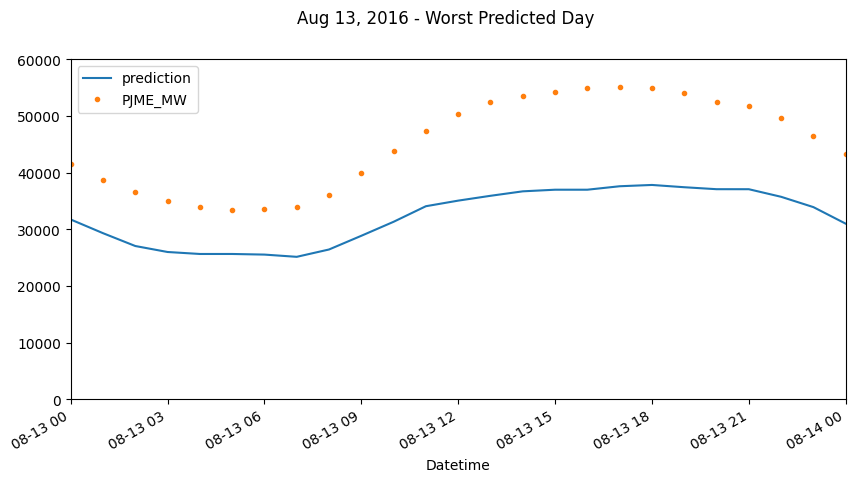

In [64]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(10)
_ = test_11[['prediction','PJME_MW']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 60000)
ax.set_xbound(lower='08-13-2016', upper='08-14-2016')
plot = plt.suptitle('Aug 13, 2016 - Worst Predicted Day')

In [65]:
error_by_day.sort_values('abs_error', ascending=True).head(10)

PJME_MW    prediction       error   abs_error
year month day                                                    
2017 11    22   29217.375000  29087.078125  130.296956  415.290120
           2    27578.625000  27906.474609 -327.847982  467.642904
2016 4     4    28944.125000  28478.453125  465.672038  473.342773
     9     27   28633.250000  29139.320312 -506.070068  506.070068
     4     7    28235.083333  28519.781250 -284.698486  518.895264
     5     1    24503.625000  24885.962891 -382.338704  528.011230
           6    27211.833333  27535.544922 -323.711019  533.417725
     10    28   27164.791667  27270.390625 -105.597738  534.603760
2017 12    5    29750.666667  30217.970703 -467.303955  569.267822
     3     30   28777.375000  29031.451172 -254.076009  590.635742

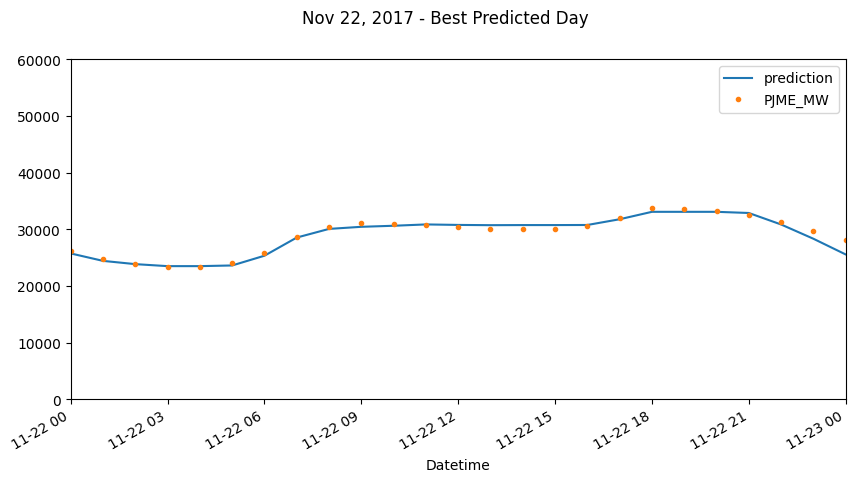

In [66]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(10)
_ = test_11[['prediction','PJME_MW']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 60000)
ax.set_xbound(lower='11-22-2017', upper='11-23-2017')
plot = plt.suptitle('Nov 22, 2017 - Best Predicted Day')

Model performing well in month of october and also in May
but not performing great on holidays or during holiday seasons.

In [67]:
def mean_absolute_percentage_error(y_true, y_pred):
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [68]:
mean_absolute_percentage_error(y_true=test_11['PJME_MW'],
                   y_pred=test_11['prediction'])

8.802083363132695

In [69]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100, 500, 1000],
    'learning_rate': [0.01, 0.05, 0.1]
}

model = XGBRegressor()
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)


Best parameters: {'learning_rate': 0.01, 'n_estimators': 500}


In [70]:
import pandas as pd
import numpy as np

# Assume your existing feature engineering steps included year, month, etc.
# Create a new dataframe for the year 2030
future_dates = pd.date_range(start='2030-01-01', end='2030-12-31', freq='H')
future_df = pd.DataFrame(future_dates, columns=['Datetime'])

# Set the index of future_df to the future_dates
future_df.index = future_dates  # Use future_dates as the index

future_df = create_features(future_df)
future_df

,Datetime,year,month,day,hour,dayofweek,dayofyear,weekofyear
2030-01-01 00:00:00,2030-01-01 00:00:00,2030,1,1,0,1,1,1
2030-01-01 01:00:00,2030-01-01 01:00:00,2030,1,1,1,1,1,1
2030-01-01 02:00:00,2030-01-01 02:00:00,2030,1,1,2,1,1,1
2030-01-01 03:00:00,2030-01-01 03:00:00,2030,1,1,3,1,1,1
2030-01-01 04:00:00,2030-01-01 04:00:00,2030,1,1,4,1,1,1
...,...,...,...,...,...,...,...,...
2030-12-30 20:00:00,2030-12-30 20:00:00,2030,12,30,20,0,364,1
2030-12-30 21:00:00,2030-12-30 21:00:00,2030,12,30,21,0,364,1
2030-12-30 22:00:00,2030-12-30 22:00:00,2030,12,30,22,0,364,1
2030-12-30 23:00:00,2030-12-30 23:00:00,2030,12,30,23,0,364,1


In [71]:
X_future = future_df.drop(columns=['Datetime'])
X_future


,year,month,day,hour,dayofweek,dayofyear,weekofyear
2030-01-01 00:00:00,2030,1,1,0,1,1,1
2030-01-01 01:00:00,2030,1,1,1,1,1,1
2030-01-01 02:00:00,2030,1,1,2,1,1,1
2030-01-01 03:00:00,2030,1,1,3,1,1,1
2030-01-01 04:00:00,2030,1,1,4,1,1,1
...,...,...,...,...,...,...,...
2030-12-30 20:00:00,2030,12,30,20,0,364,1
2030-12-30 21:00:00,2030,12,30,21,0,364,1
2030-12-30 22:00:00,2030,12,30,22,0,364,1
2030-12-30 23:00:00,2030,12,30,23,0,364,1


In [72]:
param_grid = {
    'n_estimators': [100, 500, 1000],
    'learning_rate': [0.01, 0.05, 0.1]
}

model = XGBRegressor()
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)  # Fit the model here

best_model = grid_search.best_estimator_

In [73]:
# Reorder columns in X_future to match the order in X_train
X_future = X_future[X_train.columns] # Use the column names from X_train to ensure the order is correct

future_df['prediction'] = best_model.predict(X_future)

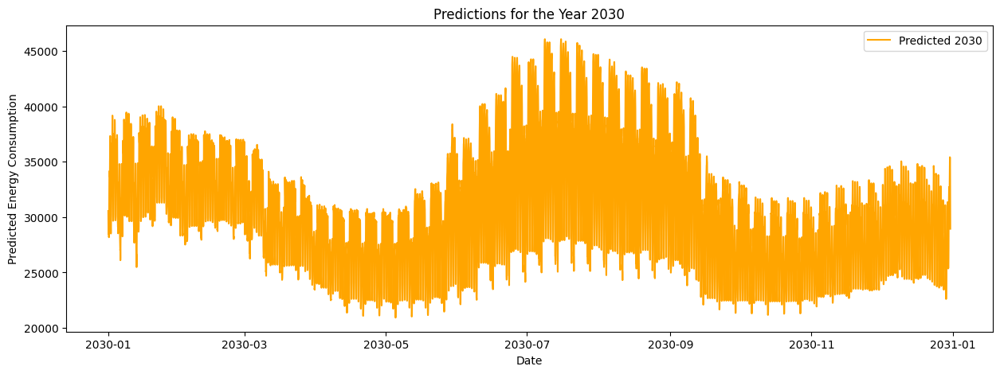

In [74]:


# Plotting the predictions
plt.figure(figsize=(15, 5))
plt.plot(future_df['Datetime'], future_df['prediction'], label='Predicted 2030', color='orange')
plt.title('Predictions for the Year 2030')
plt.xlabel('Date')
plt.ylabel('Predicted Energy Consumption')
plt.legend()
plt.show()

In [75]:
future_df

,Datetime,year,month,day,hour,dayofweek,dayofyear,weekofyear,prediction
2030-01-01 00:00:00,2030-01-01 00:00:00,2030,1,1,0,1,1,1,30560.224609
2030-01-01 01:00:00,2030-01-01 01:00:00,2030,1,1,1,1,1,1,29170.800781
2030-01-01 02:00:00,2030-01-01 02:00:00,2030,1,1,2,1,1,1,28541.380859
2030-01-01 03:00:00,2030-01-01 03:00:00,2030,1,1,3,1,1,1,28482.345703
2030-01-01 04:00:00,2030-01-01 04:00:00,2030,1,1,4,1,1,1,28482.345703
...,...,...,...,...,...,...,...,...,...
2030-12-30 20:00:00,2030-12-30 20:00:00,2030,12,30,20,0,364,1,35353.132812
2030-12-30 21:00:00,2030-12-30 21:00:00,2030,12,30,21,0,364,1,35362.402344
2030-12-30 22:00:00,2030-12-30 22:00:00,2030,12,30,22,0,364,1,34188.585938
2030-12-30 23:00:00,2030-12-30 23:00:00,2030,12,30,23,0,364,1,31800.365234


In [76]:
future_df_aug=future_df[future_df['month']==8]
future_df_aug

,Datetime,year,month,day,hour,dayofweek,dayofyear,weekofyear,prediction
2030-08-01 00:00:00,2030-08-01 00:00:00,2030,8,1,0,3,213,31,32932.101562
2030-08-01 01:00:00,2030-08-01 01:00:00,2030,8,1,1,3,213,31,30405.527344
2030-08-01 02:00:00,2030-08-01 02:00:00,2030,8,1,2,3,213,31,28388.787109
2030-08-01 03:00:00,2030-08-01 03:00:00,2030,8,1,3,3,213,31,27358.500000
2030-08-01 04:00:00,2030-08-01 04:00:00,2030,8,1,4,3,213,31,27261.220703
...,...,...,...,...,...,...,...,...,...
2030-08-31 19:00:00,2030-08-31 19:00:00,2030,8,31,19,5,243,35,37154.128906
2030-08-31 20:00:00,2030-08-31 20:00:00,2030,8,31,20,5,243,35,36840.425781
2030-08-31 21:00:00,2030-08-31 21:00:00,2030,8,31,21,5,243,35,36836.253906
2030-08-31 22:00:00,2030-08-31 22:00:00,2030,8,31,22,5,243,35,35398.097656


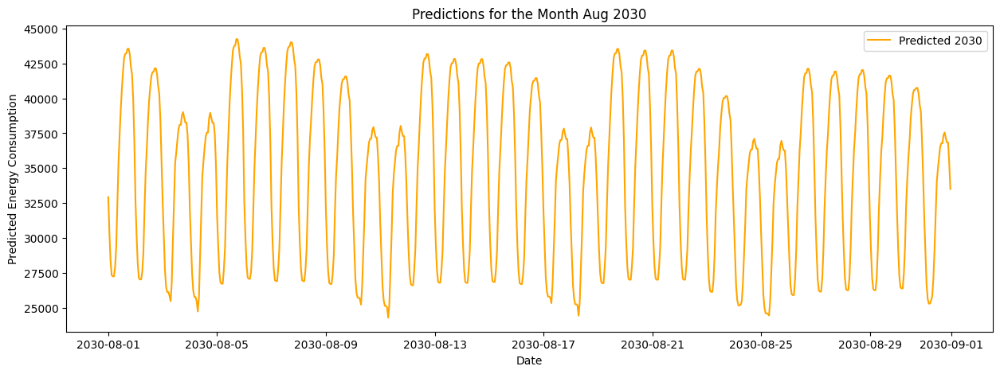

In [77]:


# Plotting the predictions
plt.figure(figsize=(15, 5))
plt.plot(future_df_aug['Datetime'], future_df_aug['prediction'], label='Predicted 2030', color='orange')
plt.title('Predictions for the Month Aug 2030')
plt.xlabel('Date')
plt.ylabel('Predicted Energy Consumption')
plt.legend()
plt.show()